In [75]:
import numpy as np
import pandas as pd

import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.cbook import boxplot_stats

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA

In [76]:
path = 'https://raw.githubusercontent.com/leomag/music-prediction/main/dataset.csv'

 - track_id: ID трека
 - artists: имена артистов
 - album_name: имя альбома
 - track_name: название трека
 - popularity: популярность трека от 0 до 100
 - duration_ms: длина трека в миллисекундах
 - explicit: есть ли я явно текст в треке
 - danceability: коэффициент танцевальности трека, значение 0.0 соответствует наименее танцевальному, а значение 1.0 наиболее танцевальному
 - energy: энергичность трека от 0,0 до 1,0 и представляет перцептивную меру интенсивности и активности
 - key: тональность, в которой находится трек, целые числа сопоставляются с высотой тональностью, используя стандартную нотацию Pitch Class. Например. 0 = C, 1 = C♯/D♭, 2 = D и так далее. Если key не обнаружен, значение равно -1.
 - loudness: общая громкость дорожки в децибелах (дБ)
 - mode: режим указывает модальность (мажор или минор) трека, тип гаммы, из которого получено его мелодическое содержание. Мажор представлен 1, а минор 0
 - speechiness: определяет наличие произнесенных слов в дорожке. Чем больше запись похожа на речь (например, ток-шоу, аудиокнига, поэзия), тем значение атрибута ближе к 1,0. Значения выше 0,66 описывают треки, которые, вероятно, полностью состоят из произнесенных слов. Значения от 0,33 до 0,66 описывают треки, которые могут содержать как музыку, так и речь, либо по частям, либо по слоям, включая такие случаи, как рэп. Значения ниже 0,33, скорее всего, представляют музыку и другие треки, не похожие на речь
 - acousticness: показатель достоверности того, что трек является акустическим от 0,0 до 1,0, где 1.0 означает высокую уверенность в том, что трек является акустическим
 - instrumentalness: предсказывает, содержит ли трек вокал. Звуки «ох» и «ааа» в этом контексте рассматриваются как инструментальные. Треки в стиле рэп или разговорные слова явно «вокальные». Чем ближе значение инструментальности к 1,0, тем больше вероятность того, что трек не содержит вокального содержания
 - liveness: определяет присутствие живого звука в записи. Более высокие значени представляют собой повышенную вероятность того, что трек был исполнен вживую. Значение выше 0,8 дает высокую вероятность того, что трек вживую исполнен
 - valence: мера от 0,0 до 1,0, описывающая музыкальную позитивность, передаваемую треком. Треки с высокой валентностью звучат более позитивно (например, счастливые, веселые, эйфорические), а треки с низкой валентностью звучат более негативно (например, грустные, подавленные, злые)
 - tempo: общий предполагаемый темп дорожки в ударах в минуту (BPM). В музыкальной терминологии темп - это скорость или темп данного произведения, который напрямую зависит от duration
 - time_signature: предполагаемый тактовый размер. Тактовый размер - это условное обозначение, указывающее, сколько единиц в каждом такте. Тактовый размер варьируется от 3 до 7, что указывает на размер от 3/4 до 7/4
 - track_genre: жанр, к которому относится трек

In [77]:
data = pd.read_csv(path, index_col='Unnamed: 0')

In [78]:
data.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [79]:
data.tail(10)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
113990,2A4dSiJmbviL56CBupkh6C,Lucas Cervetti,Frecuencias Álmicas en 432hz (Solo Piano),Frecuencia Álmica XI - Solo Piano,22,369049,False,0.579,0.245,4,-16.357,1,0.0384,0.97000,0.924000,0.1010,0.3020,112.011,3,world-music
113991,0CE0Y6GM75cbrqao8EOAlW,Chris Tomlin,The Ultimate Playlist,At The Cross (Love Ran Red),32,250629,False,0.387,0.531,8,-4.788,1,0.0290,0.00305,0.000000,0.2010,0.1530,146.003,4,world-music
113992,3FjOBB4EyIXHYUtSgrIdY9,Jesus Culture,Revelation Songs,Your Love Never Fails,38,312566,False,0.475,0.860,10,-4.722,1,0.0421,0.00650,0.000002,0.2460,0.4270,113.949,4,world-music
113993,4OkMK49i3NApR1KsAIsTf6,Chris Tomlin,See The Morning (Special Edition),How Can I Keep From Singing,39,256026,False,0.505,0.687,10,-4.375,1,0.0287,0.08410,0.000000,0.1880,0.3820,104.083,3,world-music
113994,4WbOUe6T0sozC7z5ZJgiAA,Lucas Cervetti,Frecuencias Álmicas en 432hz,"Frecuencia Álmica, Pt. 4",22,305454,False,0.331,0.171,1,-15.668,1,0.0350,0.92000,0.022900,0.0679,0.3270,132.147,3,world-music
113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.235,5,-16.393,1,0.0422,0.64000,0.928000,0.0863,0.0339,125.995,5,world-music
113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.117,0,-18.318,0,0.0401,0.99400,0.976000,0.1050,0.0350,85.239,4,world-music
113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.329,0,-10.895,0,0.0420,0.86700,0.000000,0.0839,0.7430,132.378,4,world-music
113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.506,7,-10.889,1,0.0297,0.38100,0.000000,0.2700,0.4130,135.960,4,world-music
113999,2hETkH7cOfqmz3LqZDHZf5,Cesária Evora,Miss Perfumado,Barbincor,22,241826,False,0.526,0.487,1,-10.204,0,0.0725,0.68100,0.000000,0.0893,0.7080,79.198,4,world-music


In [80]:
data.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre'],
      dtype='object')

In [81]:
data.shape

(114000, 20)

In [82]:
data.dtypes


track_id             object
artists              object
album_name           object
track_name           object
popularity            int64
duration_ms           int64
explicit               bool
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature        int64
track_genre          object
dtype: object

In [83]:
data.isna().sum()

track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

Есть небольшое количество пропусков (artists, album_name, track_name)

In [84]:
df = data.copy().dropna()

In [85]:
df.isna().sum()

track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [86]:
num_cols = df.select_dtypes(exclude='object')
num_cols.shape

(113999, 15)

In [87]:
num_cols.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,113999.000000,1.139990e+05,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000
mean,33.238827,2.280312e+05,0.566801,0.641383,5.309126,-8.258950,0.637558,0.084652,0.314907,0.156051,0.213554,0.474066,122.147695,3.904034
std,22.304959,1.072961e+05,0.173543,0.251530,3.559999,5.029357,0.480708,0.105733,0.332522,0.309556,0.190378,0.259261,29.978290,0.432623
min,0.000000,8.586000e+03,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218500,4.000000
50%,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.597500,0.049000,0.273000,0.683000,140.071000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [88]:
cat_cols = df.select_dtypes(include='object')
cat_cols.head()

,track_id,artists,album_name,track_name,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,acoustic


In [89]:
cat_cols.describe()

,track_id,artists,album_name,track_name,track_genre
count,113999,113999,113999,113999,113999
unique,89740,31437,46589,73608,114
top,6S3JlDAGk3uu3NtZbPnuhS,The Beatles,Alternative Christmas 2022,Run Rudolph Run,acoustic
freq,9,279,195,151,1000


In [90]:
# for c in cat_cols:
#     columnSeriesObj = cat_cols[c]
#     print(columnSeriesObj.values)

In [91]:
cat_cols.loc[cat_cols.track_genre == 'world-music'].count()

track_id       1000
artists        1000
album_name     1000
track_name     1000
track_genre    1000
dtype: int64

In [92]:
cat_cols.loc[cat_cols.track_genre == 'jazz'].count()

track_id       1000
artists        1000
album_name     1000
track_name     1000
track_genre    1000
dtype: int64

In [93]:
cat_cols.loc[cat_cols.track_genre == 'children'].count()

track_id       1000
artists        1000
album_name     1000
track_name     1000
track_genre    1000
dtype: int64

Примерно выходит что каждого жанра по 1000.

Чтобы можно было с этим работать надо перевести объекты в числа.

In [94]:
if 1:
    le = LabelEncoder()
    for c in cat_cols.columns:
        df[c] = le.fit_transform(cat_cols[c])
df.head()       

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,62845,10357,8100,11741,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,0
1,55667,3287,14796,22528,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,0
2,19766,12397,39162,60774,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,0
3,77941,14839,8580,9580,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,0
4,68241,5255,16899,25689,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,0


In [95]:
df = df.drop('explicit', axis=1)

In [96]:
df.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,62845,10357,8100,11741,73,230666,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,0
1,55667,3287,14796,22528,55,149610,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,0
2,19766,12397,39162,60774,57,210826,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,0
3,77941,14839,8580,9580,71,201933,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,0
4,68241,5255,16899,25689,82,198853,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,0


In [97]:
num_cols = df.select_dtypes(exclude='object')
num_cols.shape
num_cols.describe()

,track_id,artists,album_name,track_name,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
count,113999.000000,113999.000000,113999.00000,113999.000000,113999.000000,1.139990e+05,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000
mean,44861.739235,15749.375626,22548.64633,36443.501145,33.238827,2.280312e+05,0.566801,0.641383,5.309126,-8.258950,0.637558,0.084652,0.314907,0.156051,0.213554,0.474066,122.147695,3.904034,56.499925
std,25924.195201,9077.699993,13442.41065,20933.210685,22.304959,1.072961e+05,0.173543,0.251530,3.559999,5.029357,0.480708,0.105733,0.332522,0.309556,0.190378,0.259261,29.978290,0.432623,32.907978
min,0.000000,0.000000,0.00000,0.000000,0.000000,8.586000e+03,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,22414.500000,7988.000000,10945.50000,18638.500000,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218500,4.000000,28.000000
50%,44886.000000,15609.000000,22406.00000,36216.000000,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000,56.000000
75%,67265.500000,23619.000000,34063.00000,54390.500000,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.597500,0.049000,0.273000,0.683000,140.071000,4.000000,85.000000
max,89739.000000,31436.000000,46588.00000,73607.000000,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000,113.000000


In [98]:
df_class = df['track_genre']

In [99]:
df_class.describe

<bound method NDFrame.describe of 0           0
1           0
2           0
3           0
4           0
         ... 
113995    113
113996    113
113997    113
113998    113
113999    113
Name: track_genre, Length: 113999, dtype: int64>

In [100]:
df.describe()

,track_id,artists,album_name,track_name,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
count,113999.000000,113999.000000,113999.00000,113999.000000,113999.000000,1.139990e+05,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000
mean,44861.739235,15749.375626,22548.64633,36443.501145,33.238827,2.280312e+05,0.566801,0.641383,5.309126,-8.258950,0.637558,0.084652,0.314907,0.156051,0.213554,0.474066,122.147695,3.904034,56.499925
std,25924.195201,9077.699993,13442.41065,20933.210685,22.304959,1.072961e+05,0.173543,0.251530,3.559999,5.029357,0.480708,0.105733,0.332522,0.309556,0.190378,0.259261,29.978290,0.432623,32.907978
min,0.000000,0.000000,0.00000,0.000000,0.000000,8.586000e+03,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,22414.500000,7988.000000,10945.50000,18638.500000,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218500,4.000000,28.000000
50%,44886.000000,15609.000000,22406.00000,36216.000000,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000,56.000000
75%,67265.500000,23619.000000,34063.00000,54390.500000,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.597500,0.049000,0.273000,0.683000,140.071000,4.000000,85.000000
max,89739.000000,31436.000000,46588.00000,73607.000000,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000,113.000000


/Users/leomag/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



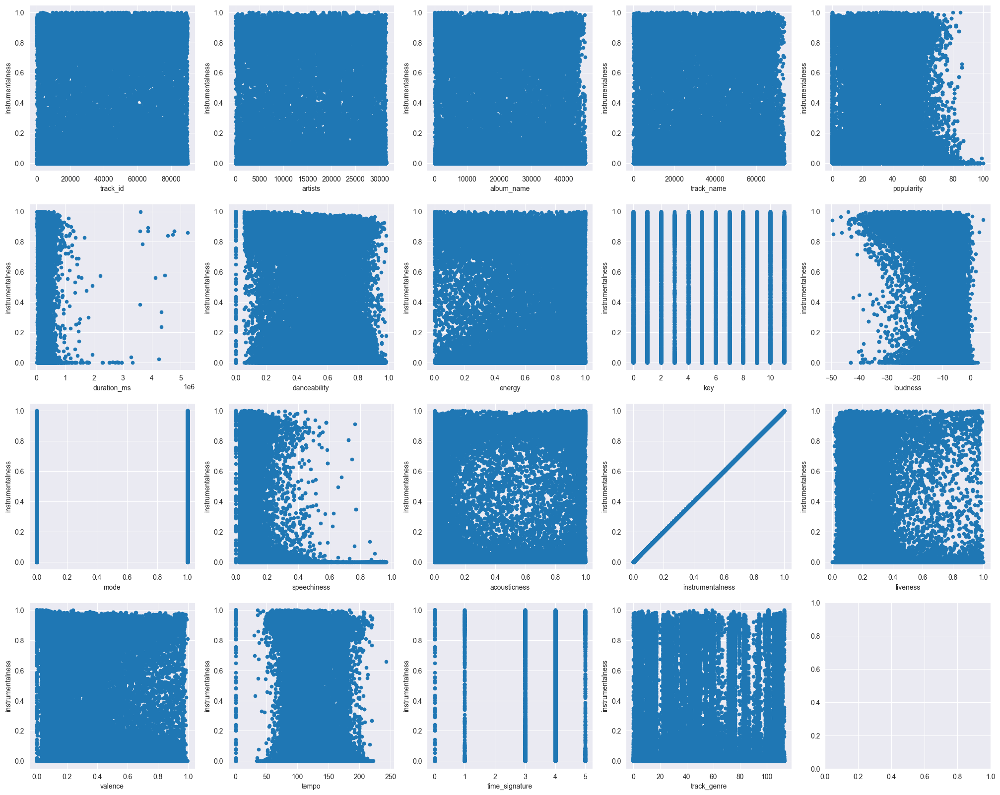

In [101]:
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(25, 20))
for idx, feature in enumerate(df.columns):
    df.plot(feature, "instrumentalness", subplots=True, kind="scatter", ax=axes[idx // 5, idx % 5])

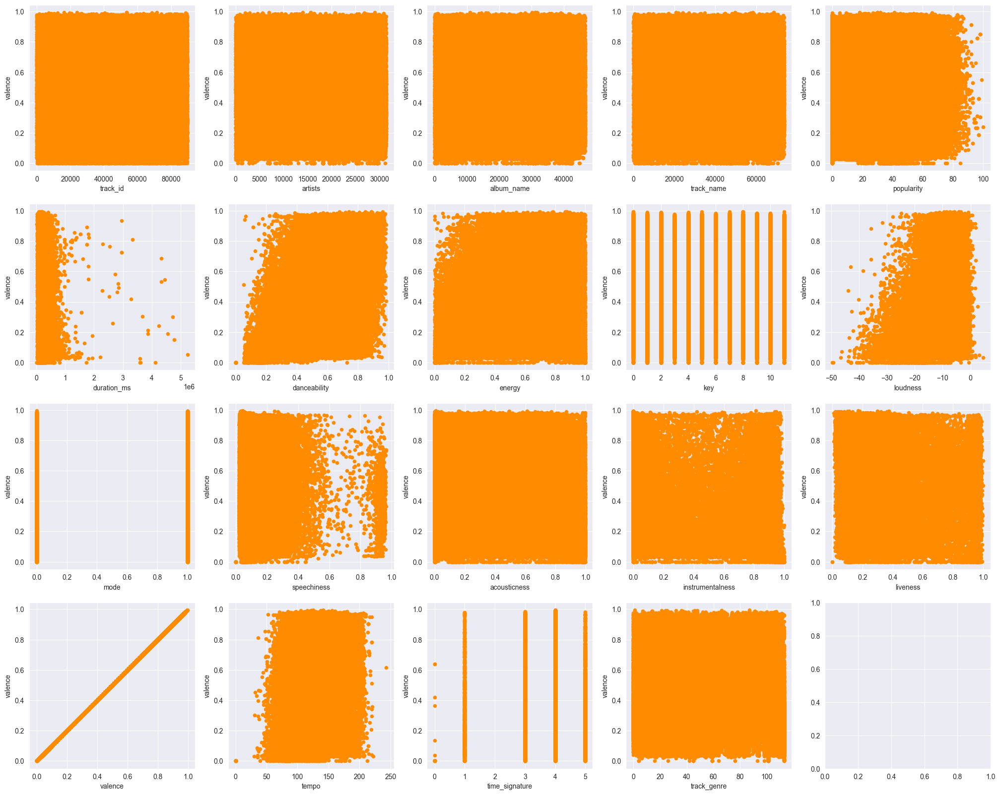

In [102]:
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(25, 20))
for idx, feature in enumerate(df.columns):
    df.plot(feature, "valence", subplots=True, kind="scatter", ax=axes[idx // 5, idx % 5], color='darkorange')

/Users/leomag/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/leomag/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/leomag/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

<AxesSubplot: xlabel='energy', ylabel='Density'>

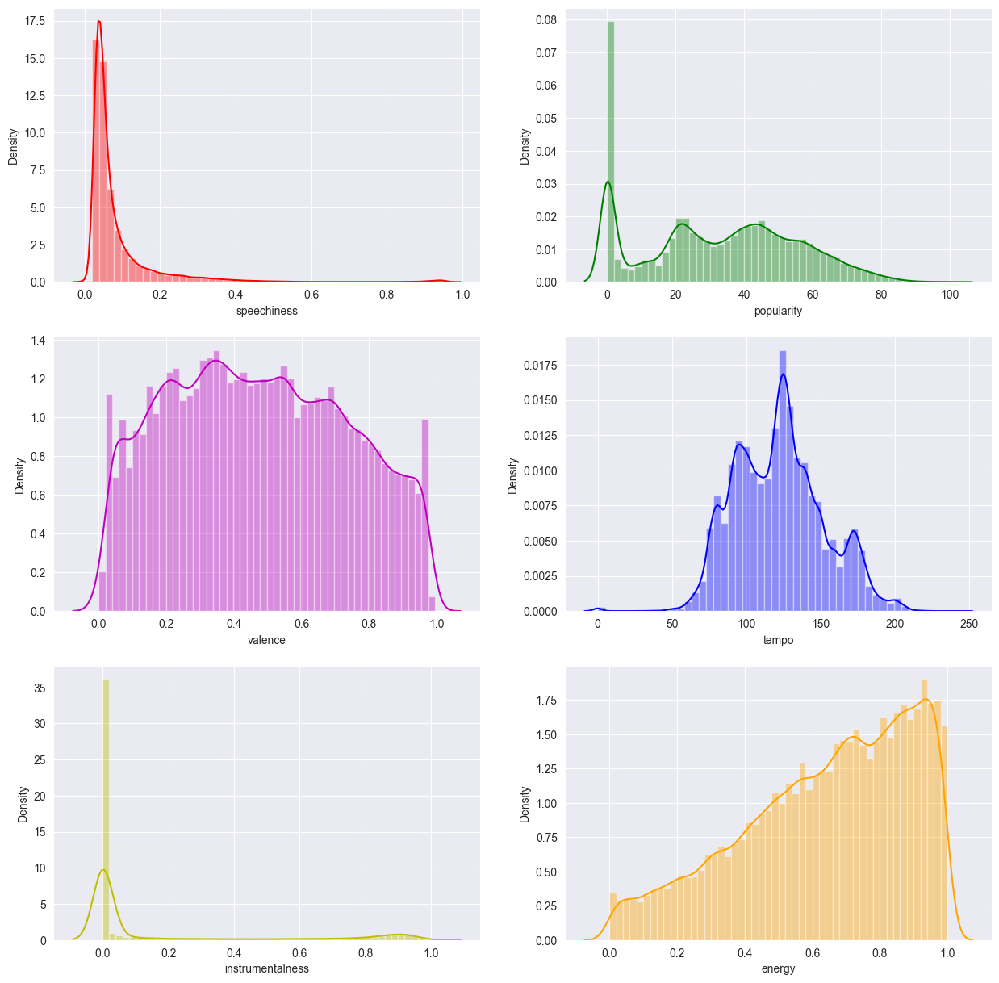

In [103]:
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
sns.distplot(df['speechiness'], bins=50, color='r', ax=axes[0, 0])
sns.distplot(df['popularity'], bins=50, color='g', ax=axes[0, 1])
sns.distplot(df['valence'], bins=50, color='m', ax=axes[1, 0])
sns.distplot(df['tempo'], bins=50, color='b', ax=axes[1, 1])
sns.distplot(df['instrumentalness'], bins=50, color='y', ax=axes[2, 0])
sns.distplot(df['energy'], bins=50, color='orange', ax=axes[2, 1])

In [104]:
data[data['tempo'] > 200]

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
32,1m5LC29RE52Bxy7hxvpOlL,Chord Overstreet,Christmas Country Songs 2022,All I Want For Christmas Is A Real Good Tan,0,234186,False,0.593,0.4550,6,-8.192,1,0.0388,0.3660,0.000000,0.0914,0.5640,202.019,4,acoustic
384,63wsZUhUZLlh1OsyrZq7sz,Boyce Avenue;Kina Grannis,"Cover Sessions, Vol. 2",Fast Car,61,304293,False,0.392,0.2510,10,-9.845,1,0.0363,0.8070,0.000000,0.0797,0.5080,204.961,4,acoustic
415,3m0jiOJfxIqGGsRKMOA2uQ,Canyon City,Wish List,Wish List,46,212760,False,0.307,0.1100,1,-15.253,1,0.0388,0.7330,0.000006,0.1110,0.3200,201.008,3,acoustic
519,6cMzeng5QA8fd2qqiMeIyg,Jonah Baker,Running Up That Hill (A Deal With God) [Acoustic],Running Up That Hill (A Deal With God) - Acoustic,51,168042,False,0.385,0.1340,5,-14.672,0,0.0476,0.8990,0.000000,0.1130,0.4270,203.816,4,acoustic
561,2dMkrhsWFVP2rHZmTEKkeh,Mat Kearney,CRAZYTALK,Wanted Man,59,235106,False,0.514,0.3190,3,-8.978,1,0.0941,0.8050,0.000000,0.2110,0.6770,203.651,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111882,4Bl3dXjJRYUBmlsA6pCpQR,Wax Tailor;Aloe Blacc;DJ Nu-Mark,B-Sides & Remixes,Time To Go - DJ Nu-Mark Remix,18,214784,False,0.565,0.7650,4,-5.252,0,0.0691,0.0163,0.000273,0.0524,0.7310,200.040,4,trip-hop
111908,25G1w3E4OMrovtPE5F510g,Portishead,Portishead,Undenied,46,260026,False,0.241,0.2810,0,-8.726,1,0.0416,0.4500,0.000007,0.0937,0.0321,222.605,3,trip-hop
112370,43f3oGrYrjcB06aNPVXH2T,Evgeny Grinko,Outtakes,Wind Brought,61,84948,False,0.282,0.0663,0,-24.072,0,0.0448,0.9890,0.930000,0.0985,0.1550,209.557,4,turkish
112893,2cqFcmV1cnzyriLe4gbkju,Umut Kaya,Umut Kaya,Ver O Güzel Gözlerinden Birini,37,215016,False,0.360,0.7440,1,-5.941,0,0.0342,0.0841,0.000000,0.0920,0.3770,203.592,4,turkish


Можно сделать заключение что у песен сразу много жанров и различные числовые параметры не говорят, что та или иная песня точно такого жанра.

In [105]:
import plotly.express as px

In [106]:
data = data.copy().dropna()
data.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,113999.000000,1.139990e+05,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000
mean,33.238827,2.280312e+05,0.566801,0.641383,5.309126,-8.258950,0.637558,0.084652,0.314907,0.156051,0.213554,0.474066,122.147695,3.904034
std,22.304959,1.072961e+05,0.173543,0.251530,3.559999,5.029357,0.480708,0.105733,0.332522,0.309556,0.190378,0.259261,29.978290,0.432623
min,0.000000,8.586000e+03,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218500,4.000000
50%,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.597500,0.049000,0.273000,0.683000,140.071000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [107]:
df.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,62845,10357,8100,11741,73,230666,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,0
1,55667,3287,14796,22528,55,149610,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,0
2,19766,12397,39162,60774,57,210826,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,0
3,77941,14839,8580,9580,71,201933,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,0
4,68241,5255,16899,25689,82,198853,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,0


In [108]:
df = pd.DataFrame(dict(
    energy = df.energy,
    genre = df.track_genre,
    speechiness = df.speechiness))

fig = px.funnel(df, x='energy', y='genre', color='speechiness')
fig.show()

In [109]:
# fig = px.scatter(x=data.track_genre=='jazz', y=df.track_name)
# fig.show()

fig = px.scatter(x=data.track_genre, y=data.danceability)
fig.show()

Танцевать, возможно, если жанр ambient, guitar, jazz, opera, romance, show-tunes, sleep, world-musiс не стоит :)